# Monitoring burnt areas in Wales

## Background

background


![Image of Yaktocat](https://ichef.bbci.co.uk/news/976/cpsprodpb/6EEF/production/_123899382_mediaitem123899380.jpg.webp)
         
                                   Burning in Mynydd Mawr. Photograph:BBC

## Description
This notebook demonstrates how the new Wales Data Cube allows to quickly analyse multiple years of Sentinel-2 optical data to monitor burnt areas. 

Contrary to radar data which are strongly correlated to height and texture, optical sensors are mainly sensitive to colour and chemistry (e.g., plant water, chlorophyll content), and as a consequence are very useful to monitor vegetation health. However, optical data have the disadvantage of operating at wavelengths impeded by cloud cover.

Living Wales project has allowed generation of national annual land cover maps which are being translated to annual habitat maps, and is also actively involved in the development of a new digital infrastructure (incl. Open Data Cube technology) for Wales that provides Analysis Ready Data, which are satellite data that have been processed to a minimum set of requirements and organized into a form that allows immediate analysis with minimum additional user effort, and derived products.

This notebook uses the Analysis Ready Sentinel-2 Data, as well as a python library for mapping burnt areas and impacted habitats developed and provided by the Living Wales project.


Topics include: 

1. Querying data for an area and period of interest
2. Loading data from datacube
3. Cleaning Sentinel-2 data
4. Mapping burnt areas
5. Mapping changes in burn scars
6. Estimating and reporting on burn extent 
7. Automatised reporting on burnt habitats 



### Jupyter Notebooks
#### Running (executing) a cell
Jupyter Notebooks allow code to be separated into sections that can be executed independent of one another.
These sections are called "cells".

Python code is written into individual cells that can be executed by placing the cursor in the cell and typing `Shift-Enter` on the keyboard or selecting the &#9658; "Run" button in the ribbon at the top of the notebook.
These options will run a single cell at a time.

To automatically run all cells in a notebook, navigate to the "Cell" tab of the menu bar at the top of JupyterLab and select "Run All" (or the option that best suits your needs).
When a cell is run, the cell's content is executed.
Any output produced from running the cell will appear directly below it.

Run the cell below as a test:

In [1]:
print("I ran a cell!")

I ran a cell!


#### Cell status
The `[ ]:` symbol to the left of each Code cell describes the state of the cell:

* `[ ]:` means that the cell has not been run yet.
* `[*]:` means that the cell is currently running.
* `[1]:` means that the cell has finished running and was the first cell run. The number indicates the order that the cells were run in.

***

## Getting started

To run this analysis, run all the cells in the notebook starting with the 'Load packages' and 'Connect to the datacube' cells.

### Load packages

Load key Python packages and supporting functions for the analysis, then connect to the datacube. 

In [2]:
# Import modules

import sys
sys.path.append("..")

import warnings
warnings.filterwarnings("ignore")

import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates

from time import time as time
import datetime as dt

import datacube
from datacube.utils.geometry import Geometry, CRS
from shapely.geometry.polygon import Polygon

from wales_utils.data_cube_utilities.wdc_datahandling import geom_fromextent, cleaning_s2, cloud_coverage
import wales_utils.data_cube_utilities.display_tools as display_tools
from wales_utils.data_cube_utilities.habitat import load_habitat_map
import wales_utils.data_cube_utilities.fires as fires

### Connect to the datacube
Connect to the datacube so we can access Living Wales Analysis Ready Data. 

In [3]:
dc = datacube.Datacube(app="BurntAreas")

### Query an area and period
#### Area :  Please choose one of the five study sites

In [4]:
# Run this cell and pick a site
site_selection = fires.burnt_site_list()
site_selection

RadioButtons(layout=Layout(width='max-content'), options=('Bwlch Corog', 'Mynydd Mawr', 'Foel Feddau', 'Glanam…

In [5]:
# Get extent of the selected site
site = fires.get_site_extent(site_selection.value)

Chosen area: Bwlch Corog


#### Display the extent of the selected forest site on ESRI World Imagery
World Imagery provides very high resolution (one meter or better) satellite and aerial imagery in many parts of the world. For Wales, images are Maxar (Vivid) imagery, with a 0.50 meters resolution. 

However, it is static imagery and, as a consequence, for each place there is only one date available, which varies between sites. 

This image is only used for visualising the extent of the selected study site and is not used in the following analyses.

In [6]:
# Display site extent
m = display_tools.map_extent(site)
m

Map(center=[52.532517, -3.846762], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

#### Period: Please choose a range of years
For this example, the default period of interest is '2021-01-01 to 2022-12-31'. 

You can change this period by using the slider. Please, in the context of this workshop and to avoid waiting, do not use more than 3 years. 

In [7]:
# Run this cell and pick a date range
years = display_tools.year_range_slider()
years

IntRangeSlider(value=(2021, 2022), description='year:', max=2022, min=2017)

In [8]:
start_date = str(years.value[0])+'-01-01'
end_date = str(years.value[1])+'-12-31'

print("Analysed period: " + start_date + " to " + end_date)

Analysed period: 2021-01-01 to 2022-12-31


### Loading data from datacube 

#### Prepare query for datacube

In [9]:
query = {'product': 'sen2_l2a_gcp',
         'geopolygon': geom_fromextent(site),
         'time': (start_date, end_date),
         'output_crs': 'epsg:27700',
         'measurements': ['nir','swir2','scl'],
         'resolution': (-10,10)}

#### Load data

In [10]:
start_time = time()

# Let's load the dataset
dataset_in = dc.load(**query)

# When using epsg other than 4326 (here: 27700), latitude and longitude are renamed y and x.
# Let's correct that and rename x and y with explicit names
dataset_in = dataset_in.rename({'x': 'longitude', 'y': 'latitude'})

print("Datacube ready")
print("Took only " + str(round(time()-start_time,2)) + " seconds to load "+ str(
    (dataset_in.time.dt.year.max()-dataset_in.time.dt.year.min()+1).values
    ) +" years of data from datacube for the selected site (i.e., "+ str(
    len(dataset_in.time)) +" images).")

Datacube ready
Took only 4.47 seconds to load 2 years of data from datacube for the selected site (i.e., 245 images).


Plotting ...
(Please wait until images appear. This may take a few seconds to minutes depending on your period of interest.)


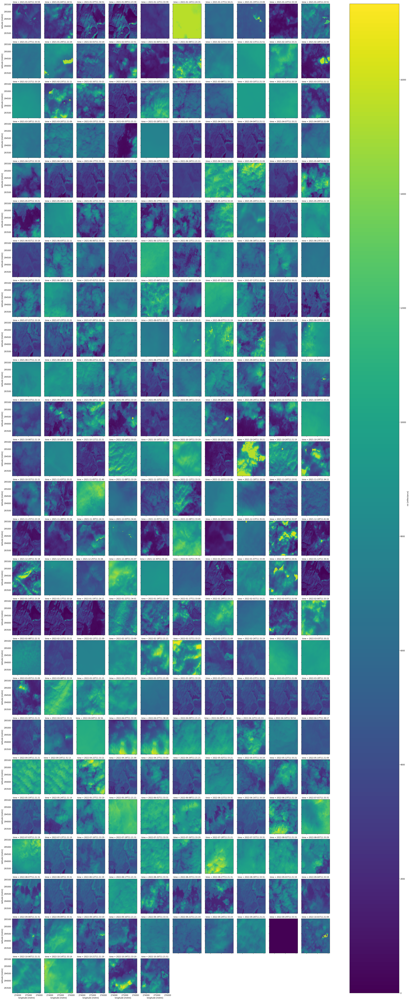

In [11]:
# Visualise dataset
print("Plotting ...")
print("(Please wait until images appear. This may take a few seconds to minutes depending on your period of interest.)")

dataset_in.nir.plot(col='time', col_wrap=10);

### Cleaning Sentinel-2 data

As we can see in the above plot, optical data are affected by cloud cover.
Filtering cloudy areas is therefore a requirement. 

The Living Wales project provides Analysis Ready Data (incl. within Wales Open Data Cube), which are satellite data that have been processed to a minimum set of requirements and organized into a form that allows immediate analysis with minimum additional user effort. 

In this regard, Living Wales has developed several python tools and libraries to minimize user efforts, including library to mask clouds and normalise data. 

Within the Wales Open Data Cube, Sentinel-2 data are provided with same format as on the EODataDown platform (i.e., with cloud mask in a separate layer and a scaling factor of 10,000). In the next cell, we clean the Sentinel-2 data (i.e., cloud masking and reflectance normalisation) using one of the data cube utilities developed by Living Wales.


#### Cloud masking and Reflectance normalisation

In this section, we clean the Sentinel-2 data using one of the data cube utilities developed by Living Wales:   `cleaning_s2()`

In [12]:
# Let's clean the Sentinel-2 dataset (i.e., cloud masking and reflectance normalisation)
dataset_clean = cleaning_s2(dataset_in)

Plotting ...
(Please wait until images appear. This may take a few seconds to minutes depending on your period of interest.)


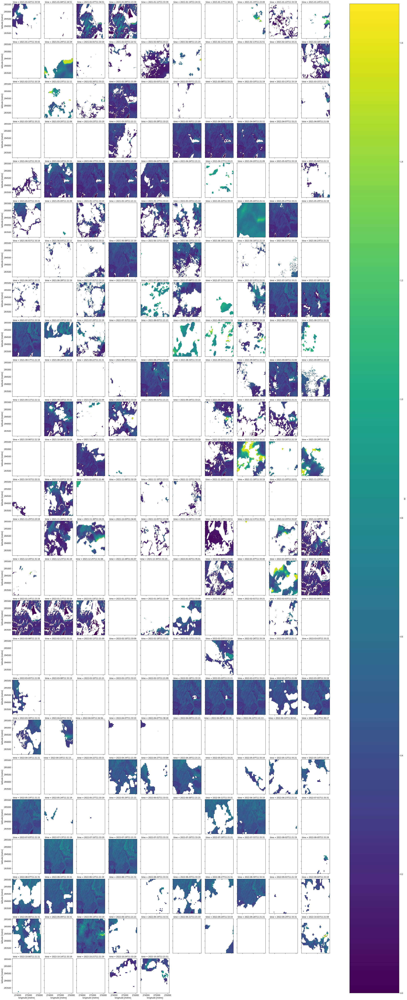

In [13]:
# Visualise clean dataset
print("Plotting ...")
print("(Please wait until images appear. This may take a few seconds to minutes depending on your period of interest.)")

dataset_clean.nir.plot(col='time', col_wrap=10);

#### Dropping useless dates

By default, all data are kept. 
However, as we can see in the above plot, cleaning data can lead to dates having only a few, or none, remaining pixels (i.e., cloud free pixels) for the region of interest. 

In the next cells, we drop the dates which contain less than a chosen coverage of cloud-free pixels.

In [14]:
# Choose a maximum cloud cover 
cloud_max_threshold = display_tools.cloud_threshold_slider()
cloud_max_threshold

IntSlider(value=20, description='Max cloud cover:', step=5)

In [15]:
# Calculating the cloud coverage (%) for each date
cloud_percentage = cloud_coverage(dataset_clean)

# Dropping dates where cloud percentage greater than cloud maximum threshold
data_2use = dataset_clean.where(cloud_percentage<=cloud_max_threshold.value, drop=True)

Plotting ...
(Please wait until images appear. This may take a few seconds)


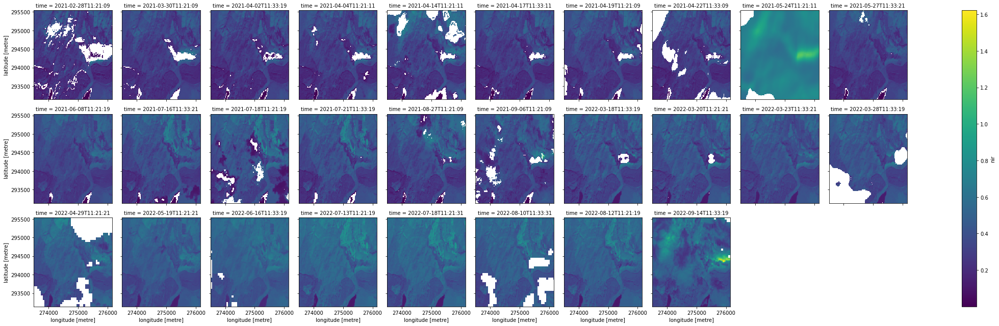

In [16]:
# Visualise clean dataset after dropping useless dates
print("Plotting ...")
print("(Please wait until images appear. This may take a few seconds)")

data_2use.nir.plot(col='time', col_wrap=10);

### Mapping burnt areas
In this section, we will sense and visualise burnt areas for each (kept) date of the period of interest. 
For this, we are using the Living Wales python tool: `burn_mapping()`


0.0-1.0 range. Applying the index to non-normalised reflectance can produce unexpected results; 
if required, resolve this by setting `normalise=True`

 Plotting ...
(Please wait until images appear. This may take a few seconds)


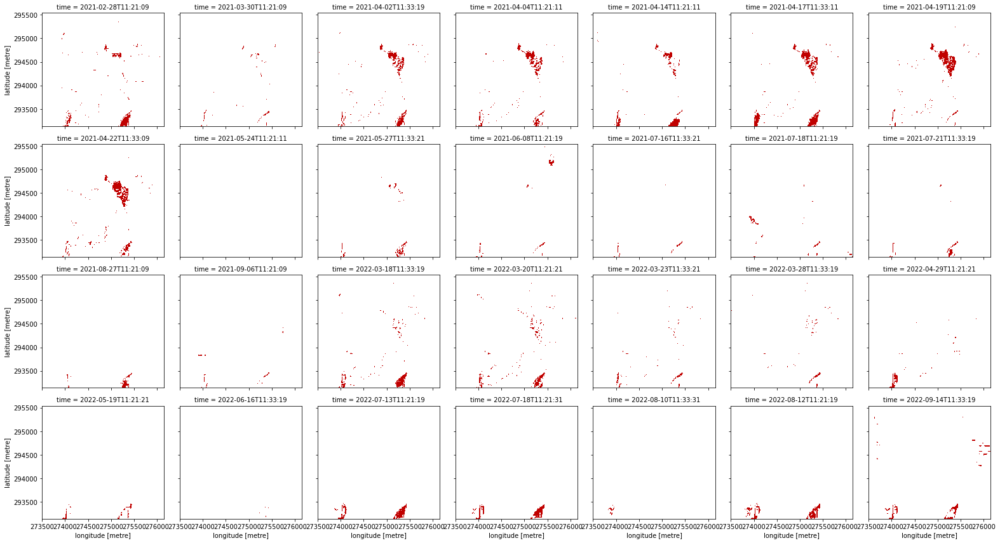

In [17]:
# Sensing burnt areas for each kept date
# 'normalise' is set to 'False', as we already normalised the reflectance when cleaning the data
burn = fires.burn_mapping(data_2use, normalise=False)


# Visualise burnt areas for each date
print("\n Plotting ...")
print("(Please wait until images appear. This may take a few seconds)")

burn.plot(col='time', col_wrap=7, add_colorbar=False, cmap="gist_heat");

### Mapping changes in burn scars

In this section, we will map the changes in burn scars through the landscape using the Living Wales `burn_progression()` tool. This allows sensing of (1) newly burnt areas, (2) areas where vegetation is growing back and (3) areas still burnt, for each consecutive available date.


- RED: newly burnt areas since previous satellite imagery
- ORANGE: areas remaining burnt
- BLUE: areas where vegetation is growing back

Plotting ...
(Please wait until images appear. This may take a few seconds)


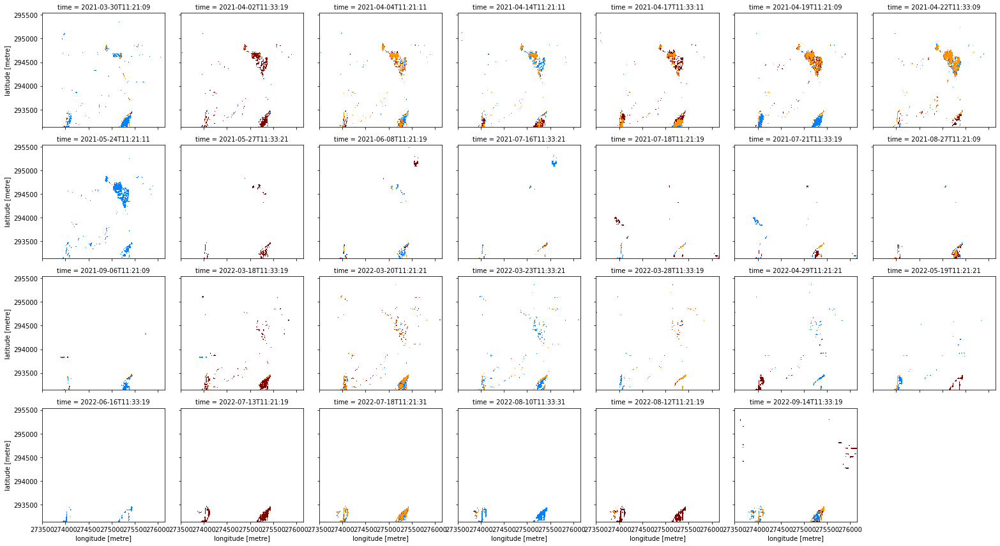

In [18]:
# Calculating burn change between each date of the studied period 
burn_changes = fires.burn_progression(burn)


# Visualising burn change between each date of the studied period 
print("Plotting ...")
print("(Please wait until images appear. This may take a few seconds)")

burn_changes.plot(col='time', col_wrap=7,cmap="jet", add_colorbar=False);

### Estimating and reporting on burn extent

In this section, we will calculate and plot the amount of burnt areas (in hectares) for each date of the period and region of interest.

Then we will report on the maximum extent of burnt areas, and date of these, per year for the region of interest.


In [19]:
# calculate the amount of burnt hectares for each date
# pixel resolution is 10m --> 1 pixel is 100 m2 i.e, 0.01 ha
burnt_area_ha = burn.where(burn > 0).count(['latitude','longitude'])*0.01

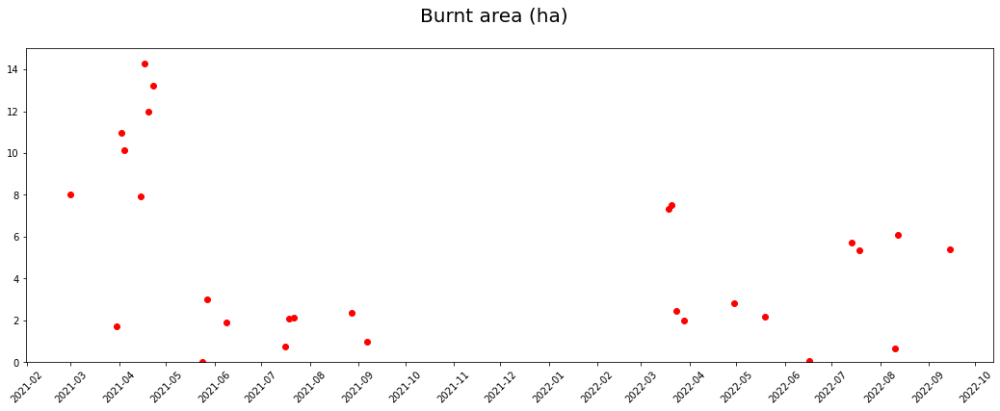

In [20]:
# Plotting the amount of burnt hectares for each date
# define figure size
fig, ax = plt.subplots(figsize=(18,6))
# add title
fig.suptitle('Burnt area (ha)', fontsize=20)
# plot amount of burnt areas
ax.plot(burnt_area_ha.time.values, burnt_area_ha.values,"o",color="red")
# set axises properties: y axis start at 0 ; x axis dates with format year-month oriented 45degrees
ax.set_ylim(bottom=0)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
ax.tick_params('x',labelrotation=45)

In [21]:
# Generate report of the annual maximum burnt area (ha) and the date when it happened.
report_annual_burnt_area = fires.report_max_burn_extent(burnt_area_ha)

# print report for each year
print("\nREPORTED MAXIMUM EXTENT OF BURNT AREA PER YEAR IN THE REGION OF INTEREST, WITH RESPECTIVE DATE: \n")
[print(report_total_year) for report_total_year in report_annual_burnt_area][0]


REPORTED MAXIMUM EXTENT OF BURNT AREA PER YEAR IN THE REGION OF INTEREST, WITH RESPECTIVE DATE: 

2021: 14.3 ha burnt by the 2021-04-17
2022: 7.53 ha burnt by the 2022-03-20


### Automatised reporting on burnt habitats

In this section, we will detect the type of habitats which were burnt during the period of interest and report on this.

In [22]:
# Loading habitat map
habitat_map = load_habitat_map(start_date, geom_fromextent(site))

# Visualising habitat map for the region of interest
display_tools.display_da(habitat_map.habitats/100, 'tab20')

Map(center=[52.53249464156663, -3.8467891593223458], controls=(ZoomControl(options=['position', 'zoom_in_text'…

In [23]:
# Generate report of burnt habitats using the burn dataset (i.e., generated in cell 18) and the habitat map 
report = fires.report_burnt_habitats(burn, habitat_map)

In [24]:
# print report
for year in report:
    print("\n  In "+year+":")
    for habitat in list(report[year].keys()):
        print(str(report[year][habitat])+" ha of "+ habitat + " burnt.")


  In 2021:
0.34 ha of Acid grassland burnt.
0.01 ha of Blanket sphagnum bog burnt.
3.33 ha of Bracken burnt.
0.09 ha of Broadleaved woodland burnt.
1.59 ha of Coniferous woodland burnt.
6.78 ha of Dry dwarf shrub heath burnt.
0.35 ha of Dry modified bog burnt.
1.14 ha of Improved grassland burnt.
0.01 ha of Juncus communities burnt.
0.09 ha of Marsh/marshy grassland burnt.
0.78 ha of Molinia communities burnt.
0.01 ha of Neutral grassland burnt.
1.16 ha of Scrub burnt.
0.02 ha of SemiNatural grass burnt.
0.39 ha of Wet modified bog burnt.
0.41 ha of Woodland and scrub burnt.

  In 2022:
0.11 ha of Acid grassland burnt.
0 ha of Blanket sphagnum bog burnt.
1.08 ha of Bracken burnt.
0.06 ha of Broadleaved woodland burnt.
1.48 ha of Coniferous woodland burnt.
1.94 ha of Dry dwarf shrub heath burnt.
0.08 ha of Dry modified bog burnt.
0.15 ha of Improved grassland burnt.
0.11 ha of Juncus communities burnt.
0.06 ha of Marsh/marshy grassland burnt.
0.24 ha of Molinia communities burnt.
0.01 

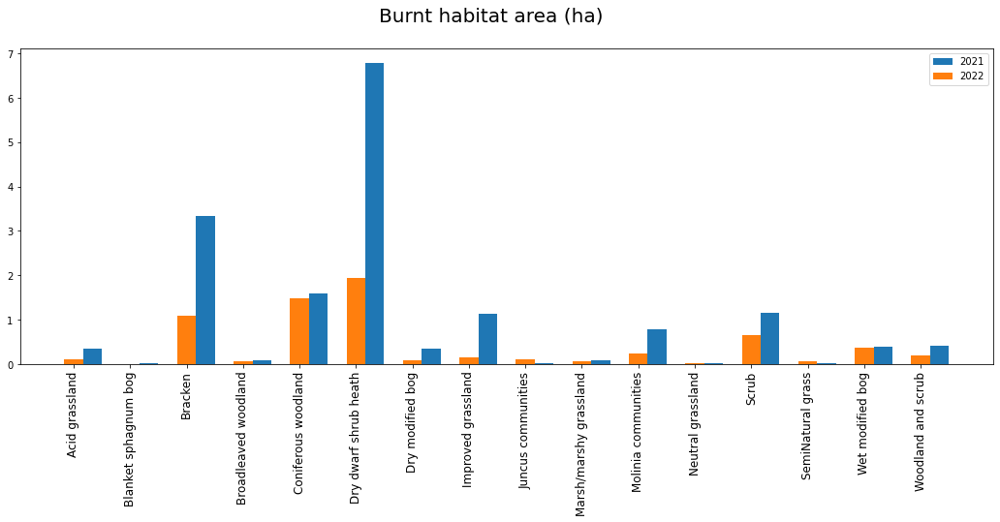

In [25]:
# Plot report results 
numb_years=len(report)
run=1

fig, ax = plt.subplots(figsize=(18,6))
fig.suptitle('Burnt habitat area (ha)', fontsize=20)
x = np.arange(len(report[list(report.keys())[0]]))  # the label locations
width = 1/(numb_years+1)  # the width of the bars
for year in range(numb_years):
    year_key = list(report.keys())[year]
    ax.bar(x + (width*run), report[year_key].values(), 
           width, label=year_key)
    run=run-1
        
ax.set_xticks(x, report[year_key].keys())
ax.tick_params('x',labelrotation=90,labelsize=12)
ax.legend()